In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import pickle

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from sklearn.model_selection import train_test_split
import os
import random
from PIL import Image
import shutil
import cv2

pd.set_option('display.max_columns', 500)
pd.set_option('display.max_colwidth', 500)

In [2]:
os.getcwd()

'/Users/anarpereira/Docs_tcc/TCC'

In [3]:
diretorio_base= '/Users/anarpereira/Docs_tcc/TCC/MIND.FungaApp/'

In [4]:
files = []
folders = []

df = pd.DataFrame(columns=['qty_files', 'folder', 'file_paths'])  # Cria um DataFrame vazio com as colunas desejadas

for pasta in os.listdir(diretorio_base):
    if 'PRE_PROCESSING' in pasta and '.' not in pasta:
        folders.append(pasta)
        caminho_pasta = os.path.join(diretorio_base, pasta)
        if os.path.isdir(caminho_pasta):
            # Obtém os arquivos da pasta
            arquivos = os.listdir(caminho_pasta)
            
            files_path = [os.path.join(pasta, arquivo) for arquivo in arquivos if '.ipy' not in arquivo]
    
            # Cria um DataFrame temporário com as informações da iteração atual
            temp_df = pd.DataFrame({'qty_files': len(files_path), 'folder': pasta, 'file_paths': [files_path]}, index=[0])
            
            if (len(files_path)!=0):
                # Concatena o DataFrame temporário com o DataFrame principal
                df = pd.concat([df, temp_df], ignore_index=True)
                files.extend(files_path)

In [5]:
df.shape

(5, 3)

In [6]:
df = df.sort_values(by='qty_files', ascending=False)[:5]

In [7]:
df[['qty_files','folder']]

,qty_files,folder
0,358,Marasmiusamazonicus_PRE_PROCESSING
2,325,Phallusindusiatuscomplex_PRE_PROCESSING
1,265,Cookeinatricholoma_PRE_PROCESSING
4,198,Coprinellusdisseminatus_PRE_PROCESSING
3,195,Schizophyllumcommune_PRE_PROCESSING


In [8]:
folders = df['folder'].to_list()

In [9]:
# Manter apenas os elementos em lista2 que estão também em lista1
lista2_filtrada = [item for item in df['folder'].to_list() if item in folders]

print("Lista 2 filtrada:", lista2_filtrada)


Lista 2 filtrada: ['Marasmiusamazonicus_PRE_PROCESSING', 'Phallusindusiatuscomplex_PRE_PROCESSING', 'Cookeinatricholoma_PRE_PROCESSING', 'Coprinellusdisseminatus_PRE_PROCESSING', 'Schizophyllumcommune_PRE_PROCESSING']


In [10]:
dict_names = {"Marasmiusamazonicus_PRE_PROCESSING":'Marasmius Amazonicus',
"Phallusindusiatuscomplex_PRE_PROCESSING":'Phallus indusiatus',
"Schizophyllumcommune_PRE_PROCESSING":'Schizophyllum commune',
"Coprinellusdisseminatus_PRE_PROCESSING":'Coprinellus Disseminatus',
"Marasmiusgriseoradiatus_PRE_PROCESSING":'Marasmius Griseoradiatus'}

In [11]:
dict_codes = {"Marasmiusamazonicus_PRE_PROCESSING":1,
"Phallusindusiatuscomplex_PRE_PROCESSING":2,
"Schizophyllumcommune_PRE_PROCESSING":3,
"Coprinellusdisseminatus_PRE_PROCESSING":4,
"Marasmiusgriseoradiatus_PRE_PROCESSING":5}

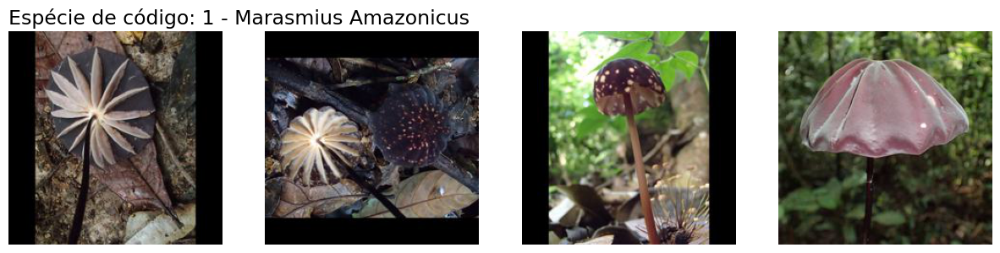

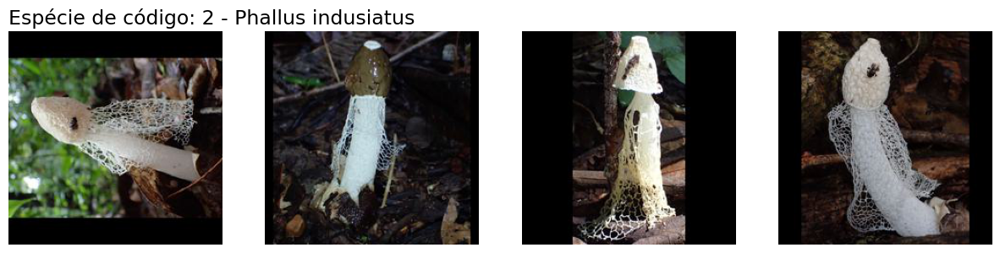

KeyError: 'Cookeinatricholoma_PRE_PROCESSING'

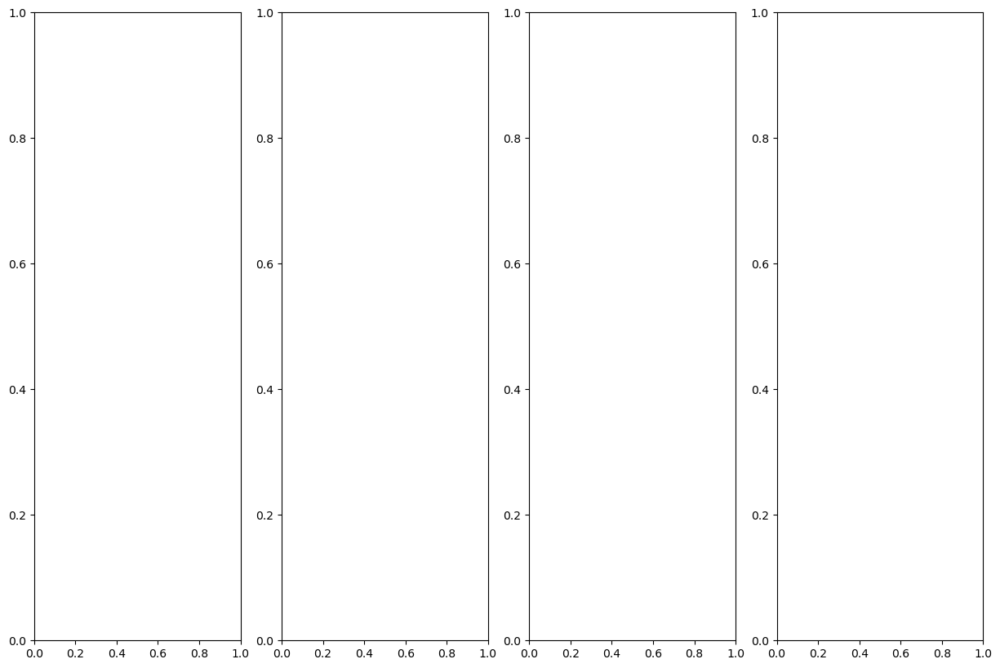

In [12]:
num_images_per_class = 4

for row_idx, (folder, file_paths) in enumerate(zip(df['folder'], df['file_paths'])):
    count = 0
    fig, axes = plt.subplots(nrows=1, ncols=num_images_per_class, figsize=(15, 10))
    axes[0].set_title(dict_names[folder])
    random.shuffle(file_paths)

    for col_idx, file_path in enumerate(file_paths):
        if count < num_images_per_class:
            img_path = os.path.join(diretorio_base, file_path)
            imagem = mpimg.imread(img_path)
            axes[col_idx].imshow(imagem)
            count += 1

# Set the class label as the title for the first image in the row
plt.tight_layout()
plt.show()

In [61]:
train_folder = os.path.join(diretorio_base, 'train')

for files_species in df['file_paths']:
    
    # determine the number of images for each set
    train_size = int(len(files_species) * 1.00)
    
    # Create destination folders if they don't exist
    for folder_path in [train_folder]:
        if not os.path.exists(folder_path):
            os.makedirs(folder_path)
            
    # Copy image files to destination folders
    for i, f in enumerate(files_species):
        if i < train_size:
            dest_folder = train_folder
        
        for folder in folders:
            if not os.path.exists(os.path.join(dest_folder, folder)):
                os.makedirs(os.path.join(dest_folder, folder))
    
        shutil.copyfile(src=os.path.join(diretorio_base, f), dst=os.path.join(dest_folder, f))

def get_data(folder_division):
    df = pd.DataFrame(columns=['species','file_path','folder','folder_division'])

    for files in os.listdir(folder_division):
        print(files)
        if '.' not in files and '.DS_Store' not in files:
            species = files.split('_')[0].lower()
            new_file_list = []
            
            for i in os.listdir(os.path.join(folder_division, files)):
                # print(i)
                if '.DS_Store' not in i:
                    new_file_list.append(i)
            qty_files = len(new_file_list)
            
            df_temp = pd.DataFrame(data={'species':[species]*qty_files,
                                         'file_path':new_file_list,
                                         'folder':[files]*qty_files,
                                         'folder_division':[folder_division]*qty_files},
                                   columns=['species','file_path','folder','folder_division'])

            df = pd.concat([df, df_temp])
    return df.reset_index()

df_train = get_data(train_folder)
df_train['full_path'] = df_train['folder_division'] + '/' + df_train['folder'] + '/' + df_train['file_path']

Marasmiusamazonicus_PRE_PROCESSING
Phallusindusiatuscomplex_PRE_PROCESSING
Marasmiusgriseoradiatus_PRE_PROCESSING
Schizophyllumcommune_PRE_PROCESSING
Coprinellusdisseminatus_PRE_PROCESSING


# Tratamento de imagem

## Removendo backgrouds

### grabCut Algorithm

O algoritmo GrabCut é uma técnica poderosa e interativa para a segmentação de imagens, que é particularmente eficaz para separar objetos de interesse do fundo em uma imagem. Ele é baseado em um modelo de gráficos (graph cuts) e combina características de cor e informações de contorno para realizar a segmentação.

Conceito Básico
O GrabCut é usado para separar o primeiro plano (o objeto de interesse) do fundo em uma imagem. A segmentação é feita iterativamente, e o usuário pode refinar o resultado interativamente. O algoritmo utiliza modelos de mistura gaussiana (GMM) para modelar as distribuições de cor do primeiro plano e do fundo.

Funcionamento do Algoritmo GrabCut
Entrada Inicial (Seleção do Retângulo):

O algoritmo começa com uma entrada inicial do usuário, que desenha um retângulo ao redor do objeto de interesse. Esse retângulo indica ao algoritmo que tudo dentro dele é provavelmente o primeiro plano (o objeto) e tudo fora é definitivamente o fundo.
Os pixels dentro do retângulo são inicialmente classificados como "provavelmente primeiro plano" ou "provavelmente fundo", enquanto os pixels fora do retângulo são classificados como "definitivamente fundo".

Modelos de Mistura Gaussiana (GMM):

O algoritmo utiliza dois modelos GMM para modelar a distribuição de cor do primeiro plano e do fundo. Os GMMs são ajustados com base nos pixels classificados como "provavelmente primeiro plano" e "provavelmente fundo".
Cada pixel é avaliado para determinar a qual das distribuições ele pertence (primeiro plano ou fundo), com base na cor.
Construção do Grafo:

O GrabCut constrói um grafo onde cada pixel é representado como um nó. As bordas entre os nós têm um peso que representa a "similaridade" entre os pixels conectados, considerando tanto a cor quanto a proximidade.
O algoritmo usa a técnica de min-cut/max-flow para cortar o grafo, separando os pixels que pertencem ao primeiro plano daqueles que pertencem ao fundo.


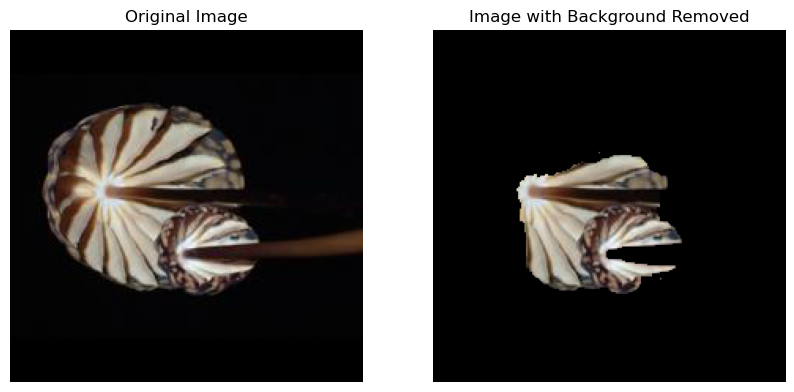

In [19]:
# Load the image
image = cv2.imread(df_train['full_path'][1])

# Create a mask
mask = np.zeros(image.shape[:2], np.uint8)

# Create temporary arrays used by the algorithm
bgdModel = np.zeros((1, 65), np.float64)
fgdModel = np.zeros((1, 65), np.float64)

# Define the rectangle (x, y, width, height) around the object
rect = (50, 
       70, image.shape[1] - 112, image.shape[0] - 112)

# Apply GrabCut algorithm
cv2.grabCut(image, mask, rect, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_RECT)

# Modify the mask to remove the background
mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
result = image * mask2[:, :, np.newaxis]

# Display the results
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Image with Background Removed')
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.show()


### Color-Based Segmentation

A segmentação baseada em cor (Color-Based Segmentation) é uma técnica de processamento de imagens usada para identificar e separar objetos em uma imagem com base nas cores dos pixels. Essa abordagem é particularmente útil em imagens onde a cor é um atributo distintivo dos objetos que você deseja segmentar, como frutas em uma árvore, carros em uma estrada, ou áreas específicas em imagens médicas.

Conceito Básico
A ideia central da segmentação baseada em cor é dividir uma imagem em diferentes regiões, onde cada região contém pixels com características de cor semelhantes. Em outras palavras, o objetivo é agrupar pixels que têm cores próximas para formar objetos ou áreas significativas na imagem.

Explanation of the Bounds:

Lower Bound (lower_bound = np.array([40, 40, 40])): This specifies the minimum hue, saturation, and value that will be considered as part of the green color.
Upper Bound (upper_bound = np.array([80, 255, 255])): This specifies the maximum hue, saturation, and value that will be considered as part of the green color.
In this example:

Hue (40 to 80): Covers a range of green hues.
Saturation (40 to 255): Ensures that both less saturated (dull) and fully saturated (vibrant) greens are included.

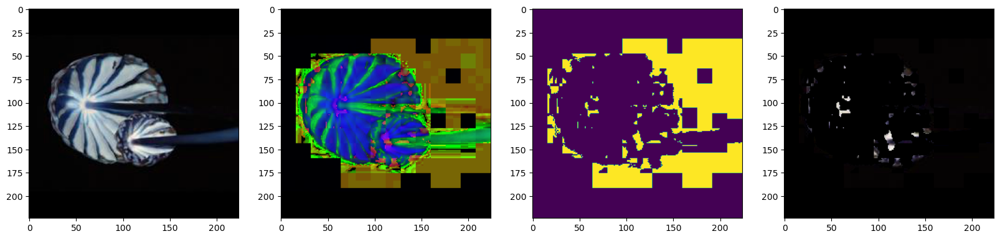

In [20]:
image = cv2.imread(df_train['full_path'][1])
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Define color range for the background
lower_bound = np.array([0, 0, 0])  # Adjust based on the background color
upper_bound = np.array([80, 255, 255])

# Create a mask for the background
mask = cv2.inRange(hsv, lower_bound, upper_bound)

# Invert the mask to get the foreground
foreground_mask = cv2.bitwise_not(mask)

# Use the mask to extract the foreground
foreground = cv2.bitwise_and(image, image, mask=foreground_mask)

fig, axs=plt.subplots(1,4, figsize=(20,20))

axs[0].imshow(image)
axs[1].imshow(hsv)
axs[2].imshow(foreground_mask)
axs[3].imshow(foreground)


### Watershed

O método Watershed é uma técnica de segmentação de imagens muito usada em processamento de imagens para separar ou delimitar objetos em uma imagem, especialmente quando esses objetos estão tocando ou sobrepostos.

Conceito Básico
Pense em uma imagem em escala de cinza como se fosse uma paisagem montanhosa, onde a intensidade dos pixels representa a "altitude" das montanhas. Nessa analogia, os pontos mais claros seriam picos altos, e os pontos mais escuros seriam vales profundos.

O objetivo do método Watershed é "inundar" essa paisagem com água, começando pelos pontos mais baixos, até que as diferentes regiões, ou "bacias hidrográficas", se encontrem. O ponto onde duas bacias se encontram forma uma borda ou "crista", que será a linha de separação entre diferentes objetos ou regiões na imagem.


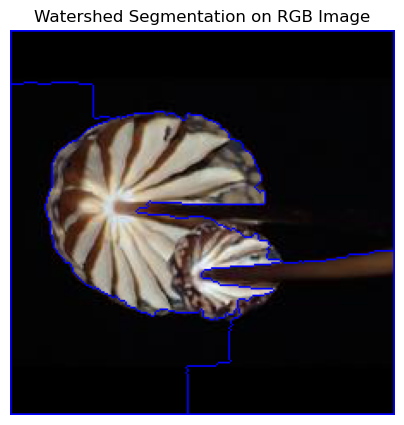

In [21]:
# Convert the image to grayscale for Watershed processing
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply a binary threshold to get a binary image
_, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

# Remove noise using morphological operations
kernel = np.ones((3, 3), np.uint8)
opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=2)

# Dilate the image to get the sure background area
sure_bg = cv2.dilate(opening, kernel, iterations=3)

# Use distance transform to find sure foreground area
dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
_, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)

# Find the unknown region
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg, sure_fg)

# Marker labeling
_, markers = cv2.connectedComponents(sure_fg)

# Add one to all labels so that the sure background is not 0, but 1
markers = markers + 1

# Mark the region of unknown with zero
markers[unknown == 255] = 0

# Apply the Watershed algorithm
markers = cv2.watershed(image, markers)

# Mark the boundaries on the original image
image[markers == -1] = [255, 0, 0]  # Boundaries in red

# Display the result
plt.figure(figsize=(5, 5))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Watershed Segmentation on RGB Image')
plt.axis('off')
plt.show()


### Lib rembg

In [86]:
from rembg import remove
def remove_bg(image):
    # image = cv2.imread(img_path)
    return remove(image, bgcolor=(0,0,0,255))

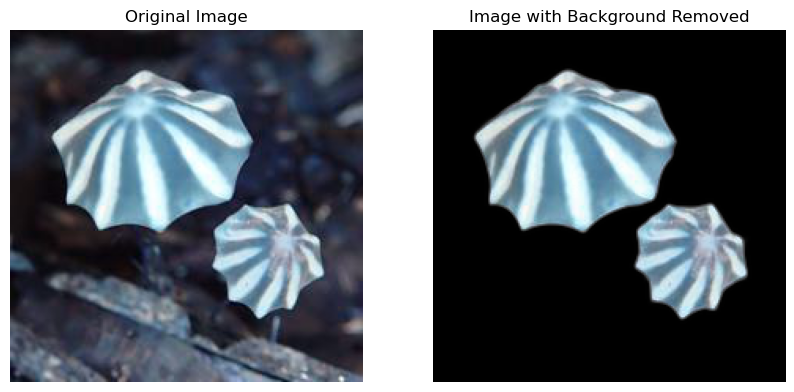

In [23]:

image = cv2.imread(df_train['full_path'][600])

output_path = 'output.png'
output = remove(image, bgcolor=(0,0,0,255))

# Display the results
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(image)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Image with Background Removed')
plt.imshow(output)
plt.axis('off')

plt.show()

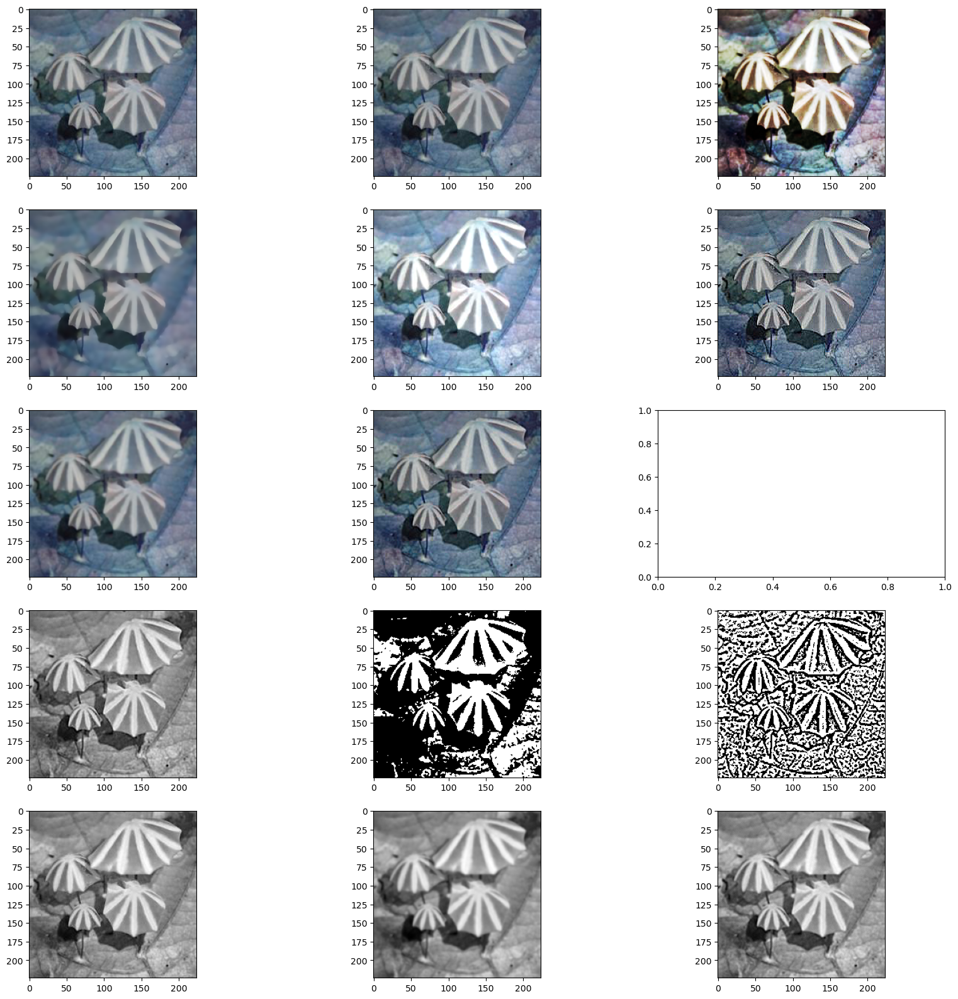

In [28]:
img_path = df_train['full_path'][534]
image = cv2.imread(img_path)
normalized_image = image / 255.0

R, G, B = cv2.split(image)
output1_R = cv2.equalizeHist(R)
output1_G = cv2.equalizeHist(G)
output1_B = cv2.equalizeHist(B)

eq_img = cv2.merge((output1_R, output1_G, output1_B))

"""Gaussian Blur:
The Gaussian blur filter reduces detail and noise in an image. 
It “blurs” the image by applying a Gaussian function to each pixel and its surrounding pixels. 
This can help smooth edges and details in preparation for edge detection or other processing techniques."""
# imagem_blur = cv2.GaussianBlur(image, (15, 15), 0)


""" Median Blur:
The median blur filter is useful for removing salt and pepper noise from an image. 
It works by replacing each pixel with the median value of its neighboring pixels.
This can help smooth out isolated noisy pixels while preserving edges."""
# imagem_blur_median = cv2.medianBlur(image, 5)

"""The Laplacian filter is used to detect edges in an image. 
It works by detecting areas of rapid intensity change.
The output will be an image with edges highlighted, which can then be used for edge detection. 
This helps identify and extract features in an image.
"""
# # Aplicar o Laplacian Filter
# imagem_laplacian = cv2.Laplacian(image, cv2.CV_64F)
# # Converter a imagem para uint8
# imagem_laplacian = cv2.convertScaleAbs(imagem_laplacian)


"""Unsharp Masking:
Unsharp masking is a technique used to sharpen details and enhance edges in an image. 
It works by subtracting a blurred version of the image from the original image. 
This amplifies edges and details, making the image appear sharper. 
Unsharp masking can be used to sharpen details before feature extraction or object detection. """

# Aplicar o Gaussian Blur para criar a imagem suavizada (blurred)
imagem_blurred = cv2.GaussianBlur(image, (15, 15), 0.75)
# Criar a máscara não nítida (Unsharp Mask)
unsharp_mask = cv2.addWeighted(image, 1.5, imagem_blurred, -0.1, 0)


bilateral_filtered_image = cv2.bilateralFilter(image, d=9, sigmaColor=75, sigmaSpace=75)

# Kernel para o filtro de nitidez
kernel = np.array([[0, -1, 0],
                   [-1, 5,-1],
                   [0, -1, 0]])

# Aplicar o filtro de nitidez
imagem_sharpen = cv2.filter2D(src=image, ddepth=-1, kernel=kernel)
imagem_sharpen_blured = cv2.filter2D(src=imagem_blurred, ddepth=-1, kernel=kernel)

gray_img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
imagem_blurred_gray = cv2.GaussianBlur(gray_img, (15, 15), 1.0)
imagem_sharpen_blured_gray = cv2.filter2D(src=imagem_blurred_gray, ddepth=-1, kernel=kernel)

# Carregar a imagem em escala de cinza
gray = cv2.cvtColor(imagem_sharpen_blured, cv2.COLOR_BGR2GRAY)


# Aplicar limiarização global
_, thresholded = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)

# Ou aplicar limiarização adaptativa
adaptive_thresholded = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                             cv2.THRESH_BINARY, 11, 2)

### Plot image with treatments 
fig, axs=plt.subplots(5,3, figsize=(20,20))

axs[0,0].imshow(image)
axs[0,1].imshow(normalized_image)
axs[0,2].imshow(eq_img)
axs[1,0].imshow(bilateral_filtered_image)
axs[1,1].imshow(unsharp_mask)
axs[1,2].imshow(imagem_sharpen)
axs[2,0].imshow(imagem_blurred)
axs[2,1].imshow(imagem_sharpen_blured)
axs[3,0].imshow(gray,cmap='gray')
axs[3,1].imshow(thresholded,cmap='gray')
axs[3,2].imshow(adaptive_thresholded,cmap='gray')
axs[4,0].imshow(gray_img,cmap='gray')
axs[4,1].imshow(imagem_blurred_gray,cmap='gray')
axs[4,2].imshow(imagem_sharpen_blured_gray,cmap='gray')

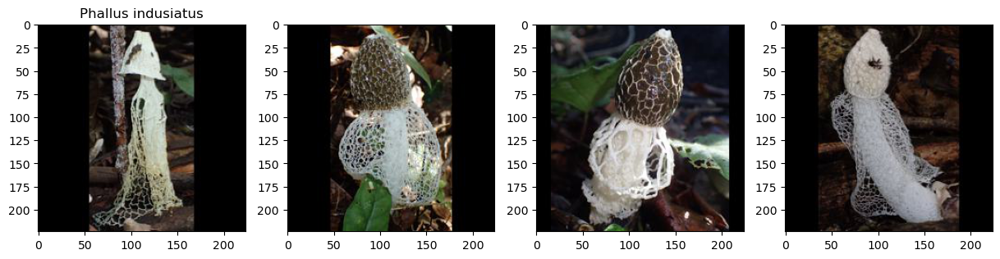

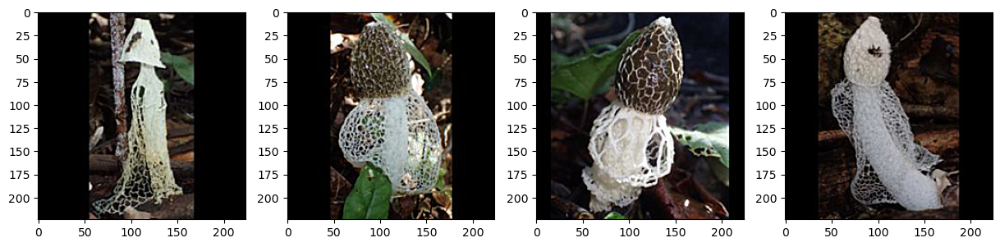

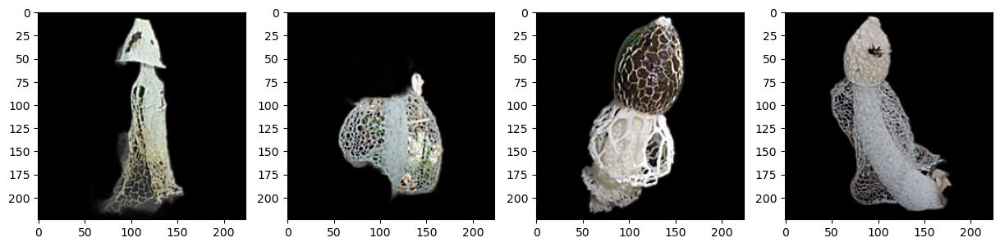

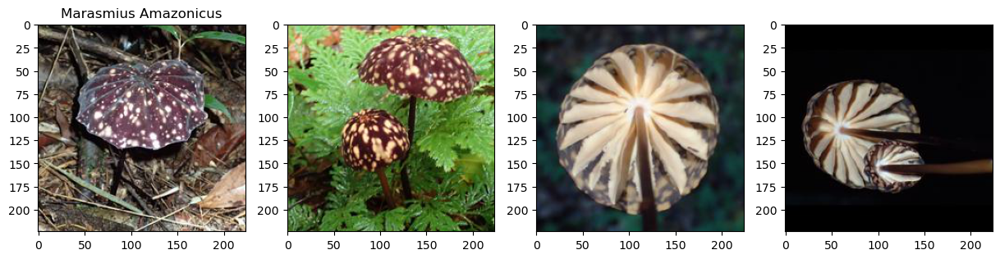

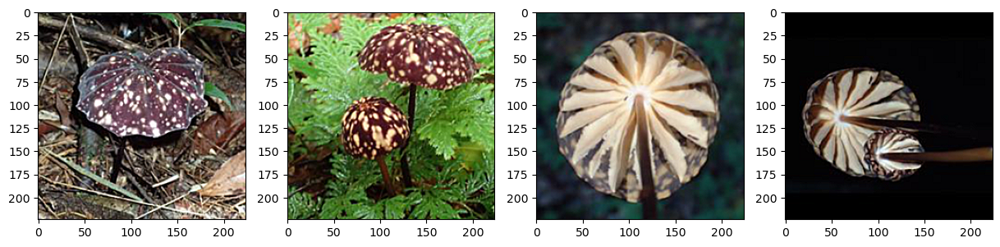

...

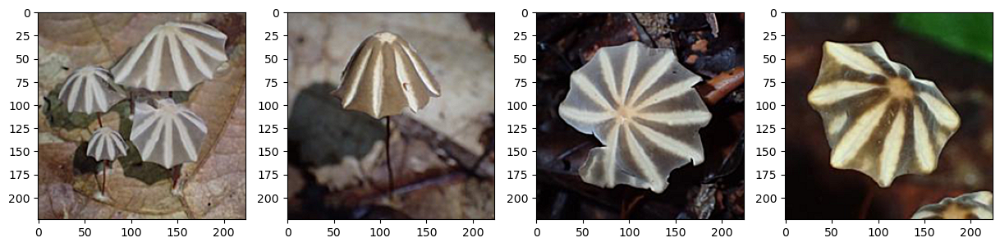

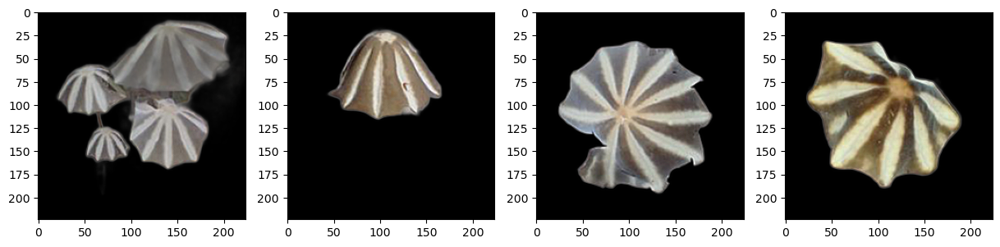

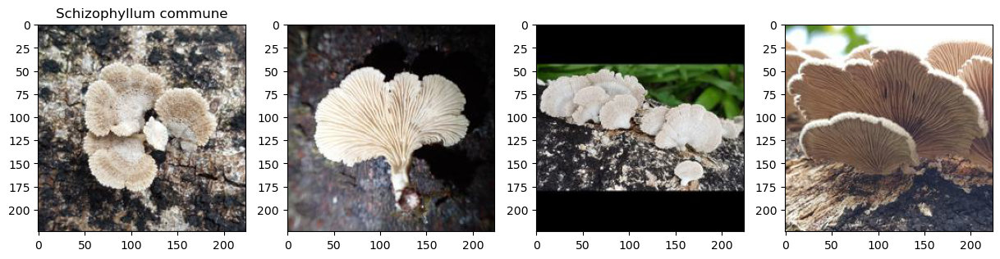

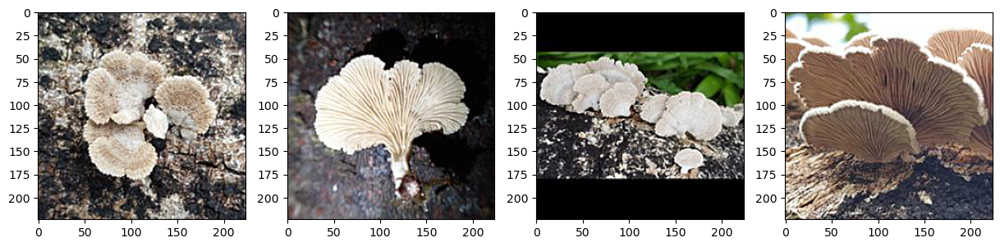

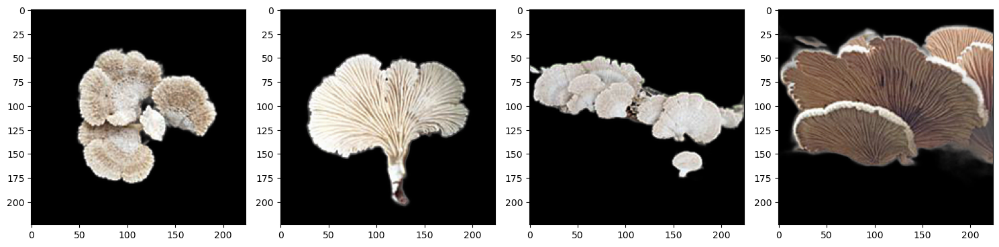

In [25]:
num_images_per_class = 4
imagem_list = []

for row_idx, (folder, file_paths) in enumerate(zip(df['folder'], df['file_paths'])):
    count = 0
    fig, axes = plt.subplots(nrows=1, ncols=num_images_per_class, figsize=(15, 10))
    fig_, axes_ = plt.subplots(nrows=1, ncols=num_images_per_class, figsize=(15, 10))
    fig__, axes__ = plt.subplots(nrows=1, ncols=num_images_per_class, figsize=(15, 10))

    axes[0].set_title(dict_names[folder])
    random.shuffle(file_paths)

    for col_idx, file_path in enumerate(file_paths):
        if count < num_images_per_class:
            img_path = os.path.join(diretorio_base, file_path)
            imagem = mpimg.imread(img_path)
            axes[col_idx].imshow(imagem)
            sharp_img = apply_sharpen_blured_filter(imagem)
            axes[col_idx].imshow(imagem)
            axes_[col_idx].imshow(sharp_img)
            axes__[col_idx].imshow(remove_bg(sharp_img))
            count += 1


# Set the class label as the title for the first image in the row
plt.tight_layout()
plt.show()

### Tratando imagens

In [88]:
def apply_sharpen_blured_filter(image):
    imagem_blurred = cv2.GaussianBlur(image, (15, 15), 0.75)
    # Kernel para o filtro de nitidez
    kernel = np.array([[0, -1, 0],
                       [-1, 5,-1],
                       [0, -1, 0]])

    sharpen = cv2.filter2D(src=imagem_blurred, ddepth=-1, kernel=kernel)
    return sharpen

In [87]:
# Criar uma nova pasta para salvar as imagens tratadas
output_dir = "imagens_tratadas"
os.makedirs(os.path.join(train_folder, output_dir), exist_ok=True)

output_dir = os.path.join(train_folder, output_dir)
# Lista para armazenar os novos caminhos das imagens tratadas
new_paths = []

# Iterar sobre as imagens no DataFrame
for image_path, folder in zip(df_train['full_path'], df_train['folder']):
    
    image = cv2.imread(image_path)
    
    
    if image is not None:
        # Aplicar o filtro de tratamento na imagem
        processed_image = apply_sharpen_blured_filter(image)
        processed_image_bg = remove_bg(processed_image)
        # Definir o novo caminho para salvar a imagem tratada
        new_image_name = f"processed_{os.path.basename(image_path)}"
        new_image_path = os.path.join(output_dir, folder, new_image_name)
        
        os.makedirs(os.path.join(output_dir, folder), exist_ok=True)
        # Salvar a imagem tratada
        cv2.imwrite(os.path.join(output_dir, folder, new_image_path), processed_image_bg)
        # Adicionar o novo caminho à lista
        new_paths.append(os.path.join(output_dir, folder, new_image_path))
    else:
        print(f"Imagem não encontrada: {image_path}")

# Adicionar a nova coluna ao DataFrame
df_train['full_path_tratamentos'] = new_paths

Vou remover na mao algumas imagens

# Modeling

In [92]:
folders_full_path = new_paths

In [94]:
import os
import numpy as np
from sklearn.model_selection import KFold
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# Definir parâmetros
input_shape = (224, 224, 3)
num_classes = 5  # Ajuste de acordo com o número de classes do seu problema
k_folds = 10 # Número de folds para cross-validation
batch_size = 32
epochs = 50

In [95]:
# Função para criar o modelo
def create_model():
    base_model = ResNet50(include_top=False, input_shape=input_shape)
    
    for layer in base_model.layers:
        layer.trainable=False
        
    model = Sequential([
        base_model,
        GlobalAveragePooling2D(),
        Dense(1024, activation='relu'),
        Dense(512, activation='relu'),
        Dense(num_classes, activation='softmax')
    ])
    
    model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])
    
    return model

In [106]:
data = []
labels = []

# Supondo que suas imagens estejam organizadas em subpastas de acordo com as classes
for folder in folders:
    full_path_folder = os.path.join(output_dir, folder)
    for class_dir in os.listdir(full_path_folder):
        class_path = os.path.join(full_path_folder, class_dir)
        data.append(class_path)
        labels.append(dict_codes[folder])  # Ou um número correspondente à classe
        
# Convertendo para arrays NumPy
data = np.array(data)
labels = np.array(labels)

In [ ]:
accuracies = []
losses = []
val_accuracies = []
val_losses = []

# Gerador de dados
datagen = ImageDataGenerator(rescale=1./255)

# KFold cross-validation
kf = KFold(n_splits=k_folds, random_state=42, shuffle=True)

fold_no = 1
for train_index, val_index in kf.split(data):
    print(f'Training fold {fold_no}/{k_folds}...')
    
    # Dividindo os dados em treino e validação
    train_data = data[train_index]
    train_labels = labels[train_index]
    df_train = pd.DataFrame({'paths':train_data, 'labels':train_labels}).astype(str)
    
    val_data = data[val_index]
    val_labels = labels[val_index]
    df_val = pd.DataFrame({'paths':val_data, 'labels':val_labels}).astype(str)

    
    # Geradores de dados
    train_generator = datagen.flow_from_dataframe(
        dataframe=df_train,
        directory=output_dir,
        x_col='paths',
        y_col='labels',
        target_size=(224, 224),
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False)
    
    val_generator = datagen.flow_from_dataframe(
        dataframe=df_val,
        directory=output_dir,
        x_col='paths',
        y_col='labels',
        target_size=(224, 224),
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False
    )
    
    # Criar o modelo
    model = create_model()
    
    # Callbacks
    early_stopping = EarlyStopping(patience=10, monitor='val_loss', mode='min')
    mcp_save = ModelCheckpoint(f'best_model_fold_{fold_no}_treat.h5', save_best_only=True, monitor='val_loss', mode='min')
    reduce_lr_loss = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=7, verbose=1, min_delta=1e-4, mode='min')
    
    # Treinar o modelo
    history = model.fit(
        train_generator,
        validation_data=val_generator,
        epochs=epochs,
        callbacks=[early_stopping, mcp_save, reduce_lr_loss]
    )
   # Armazenar os resultados
    accuracies.append(history.history['accuracy'][-1])
    losses.append(history.history['loss'][-1])
    val_accuracies.append(history.history['val_accuracy'][-1])
    val_losses.append(history.history['val_loss'][-1])
    
    fold_no += 1
    
# Criar um DataFrame com os resultados
results_df = pd.DataFrame({
    'Fold': range(0, len(accuracies)),
    'Train Accuracy': accuracies,
    'Train Loss': losses,
    'Validation Accuracy': val_accuracies,
    'Validation Loss': val_losses
})

# Salvar os resultados em um arquivo CSV
results_df.to_csv(f'cross_validation_results_treat.csv', index=False)

Training fold 1/10...
Found 890 validated image filenames belonging to 5 classes.
Found 100 validated image filenames belonging to 5 classes.


/opt/miniconda3/envs/myenv/lib/python3.10/site-packages/keras/preprocessing/image.py:989: UserWarning: Found 2 invalid image filename(s) in x_col="paths". These filename(s) will be ignored.
  warnings.warn('Found {} invalid image filename(s) in x_col="{}". '


Epoch 1/50
28/28 [==============================] - 65s 2s/step - loss: 2.5135 - accuracy: 0.1539 - val_loss: 1.6950 - val_accuracy: 0.3500 - lr: 0.0010
Epoch 2/50
28/28 [==============================] - 71s 3s/step - loss: 1.7463 - accuracy: 0.1652 - val_loss: 1.6551 - val_accuracy: 0.2100 - lr: 0.0010
Epoch 3/50
28/28 [==============================] - 88s 3s/step - loss: 1.7340 - accuracy: 0.1640 - val_loss: 1.5888 - val_accuracy: 0.3500 - lr: 0.0010
Epoch 4/50
28/28 [==============================] - 91s 3s/step - loss: 1.6205 - accuracy: 0.2663 - val_loss: 1.5770 - val_accuracy: 0.2600 - lr: 0.0010
Epoch 5/50
28/28 [==============================] - 90s 3s/step - loss: 1.6144 - accuracy: 0.1888 - val_loss: 1.6003 - val_accuracy: 0.2100 - lr: 0.0010
Epoch 6/50
28/28 [==============================] - 77s 3s/step - loss: 1.5952 - accuracy: 0.2360 - val_loss: 1.5616 - val_accuracy: 0.3100 - lr: 0.0010
Epoch 7/50
28/28 [==============================] - 74s 3s/step - loss: 1.5585 - a

/opt/miniconda3/envs/myenv/lib/python3.10/site-packages/keras/preprocessing/image.py:989: UserWarning: Found 2 invalid image filename(s) in x_col="paths". These filename(s) will be ignored.
  warnings.warn('Found {} invalid image filename(s) in x_col="{}". '


Epoch 1/50
28/28 [==============================] - 119s 4s/step - loss: 2.4754 - accuracy: 0.1607 - val_loss: 1.6586 - val_accuracy: 0.2100 - lr: 0.0010
Epoch 2/50
28/28 [==============================] - 84s 3s/step - loss: 1.7592 - accuracy: 0.1404 - val_loss: 1.6161 - val_accuracy: 0.2100 - lr: 0.0010
Epoch 3/50
28/28 [==============================] - 74s 3s/step - loss: 1.6621 - accuracy: 0.2247 - val_loss: 1.6212 - val_accuracy: 0.1700 - lr: 0.0010
Epoch 4/50
28/28 [==============================] - 75s 3s/step - loss: 1.6321 - accuracy: 0.2169 - val_loss: 1.5794 - val_accuracy: 0.2200 - lr: 0.0010
Epoch 5/50
28/28 [==============================] - 84s 3s/step - loss: 1.6210 - accuracy: 0.2315 - val_loss: 1.5406 - val_accuracy: 0.3400 - lr: 0.0010
Epoch 6/50
28/28 [==============================] - 76s 3s/step - loss: 1.5770 - accuracy: 0.2966 - val_loss: 1.4969 - val_accuracy: 0.3700 - lr: 0.0010
Epoch 7/50
28/28 [==============================] - 81s 3s/step - loss: 1.5728 - 

/opt/miniconda3/envs/myenv/lib/python3.10/site-packages/keras/preprocessing/image.py:989: UserWarning: Found 2 invalid image filename(s) in x_col="paths". These filename(s) will be ignored.
  warnings.warn('Found {} invalid image filename(s) in x_col="{}". '


Epoch 1/50
28/28 [==============================] - 81s 3s/step - loss: 2.3850 - accuracy: 0.1403 - val_loss: 1.6337 - val_accuracy: 0.3030 - lr: 0.0010
Epoch 2/50
28/28 [==============================] - 83s 3s/step - loss: 1.7149 - accuracy: 0.1762 - val_loss: 1.5754 - val_accuracy: 0.4040 - lr: 0.0010
Epoch 3/50
28/28 [==============================] - 79s 3s/step - loss: 1.6669 - accuracy: 0.2020 - val_loss: 1.5799 - val_accuracy: 0.2525 - lr: 0.0010
Epoch 4/50
28/28 [==============================] - 78s 3s/step - loss: 1.6436 - accuracy: 0.2245 - val_loss: 1.5561 - val_accuracy: 0.2424 - lr: 0.0010
Epoch 5/50
28/28 [==============================] - 78s 3s/step - loss: 1.5977 - accuracy: 0.2267 - val_loss: 1.6347 - val_accuracy: 0.2424 - lr: 0.0010
Epoch 6/50
28/28 [==============================] - 78s 3s/step - loss: 1.5871 - accuracy: 0.2727 - val_loss: 1.6457 - val_accuracy: 0.2424 - lr: 0.0010
Epoch 7/50
28/28 [==============================] - 79s 3s/step - loss: 1.6290 - a

/opt/miniconda3/envs/myenv/lib/python3.10/site-packages/keras/preprocessing/image.py:989: UserWarning: Found 2 invalid image filename(s) in x_col="paths". These filename(s) will be ignored.
  warnings.warn('Found {} invalid image filename(s) in x_col="{}". '


Epoch 1/50
28/28 [==============================] - 71s 2s/step - loss: 2.9089 - accuracy: 0.1594 - val_loss: 1.7006 - val_accuracy: 0.3232 - lr: 0.0010
Epoch 2/50
28/28 [==============================] - 68s 2s/step - loss: 1.7810 - accuracy: 0.1470 - val_loss: 1.6472 - val_accuracy: 0.1111 - lr: 0.0010
Epoch 3/50
28/28 [==============================] - 68s 2s/step - loss: 1.7415 - accuracy: 0.0561 - val_loss: 1.5878 - val_accuracy: 0.3535 - lr: 0.0010
Epoch 4/50
28/28 [==============================] - 69s 2s/step - loss: 1.6563 - accuracy: 0.1975 - val_loss: 1.5412 - val_accuracy: 0.3030 - lr: 0.0010
Epoch 5/50
28/28 [==============================] - 68s 2s/step - loss: 1.6280 - accuracy: 0.2267 - val_loss: 1.5990 - val_accuracy: 0.2828 - lr: 0.0010
Epoch 6/50
28/28 [==============================] - 69s 2s/step - loss: 1.6119 - accuracy: 0.2671 - val_loss: 1.5315 - val_accuracy: 0.3232 - lr: 0.0010
Epoch 7/50
28/28 [==============================] - 67s 2s/step - loss: 1.6388 - a

/opt/miniconda3/envs/myenv/lib/python3.10/site-packages/keras/preprocessing/image.py:989: UserWarning: Found 2 invalid image filename(s) in x_col="paths". These filename(s) will be ignored.
  warnings.warn('Found {} invalid image filename(s) in x_col="{}". '


Epoch 1/50
28/28 [==============================] - 69s 2s/step - loss: 2.7104 - accuracy: 0.1134 - val_loss: 1.6173 - val_accuracy: 0.2222 - lr: 0.0010
Epoch 2/50
28/28 [==============================] - 68s 2s/step - loss: 1.6634 - accuracy: 0.1437 - val_loss: 1.5828 - val_accuracy: 0.3030 - lr: 0.0010
Epoch 3/50
28/28 [==============================] - 66s 2s/step - loss: 1.6672 - accuracy: 0.2559 - val_loss: 1.7053 - val_accuracy: 0.2222 - lr: 0.0010
Epoch 4/50
28/28 [==============================] - 68s 2s/step - loss: 1.6572 - accuracy: 0.2312 - val_loss: 1.5367 - val_accuracy: 0.3939 - lr: 0.0010
Epoch 5/50
28/28 [==============================] - 71s 3s/step - loss: 1.5814 - accuracy: 0.2761 - val_loss: 1.5209 - val_accuracy: 0.2525 - lr: 0.0010
Epoch 6/50
28/28 [==============================] - 69s 2s/step - loss: 1.5282 - accuracy: 0.2840 - val_loss: 1.4327 - val_accuracy: 0.4545 - lr: 0.0010
Epoch 7/50
28/28 [==============================] - 70s 2s/step - loss: 1.5923 - a

/opt/miniconda3/envs/myenv/lib/python3.10/site-packages/keras/preprocessing/image.py:989: UserWarning: Found 1 invalid image filename(s) in x_col="paths". These filename(s) will be ignored.
  warnings.warn('Found {} invalid image filename(s) in x_col="{}". '
/opt/miniconda3/envs/myenv/lib/python3.10/site-packages/keras/preprocessing/image.py:989: UserWarning: Found 1 invalid image filename(s) in x_col="paths". These filename(s) will be ignored.
  warnings.warn('Found {} invalid image filename(s) in x_col="{}". '


Epoch 1/50
28/28 [==============================] - 69s 2s/step - loss: 2.4663 - accuracy: 0.1020 - val_loss: 1.5623 - val_accuracy: 0.2653 - lr: 0.0010
Epoch 2/50
28/28 [==============================] - 63s 2s/step - loss: 1.7816 - accuracy: 0.1233 - val_loss: 1.5747 - val_accuracy: 0.1633 - lr: 0.0010
Epoch 3/50
28/28 [==============================] - 66s 2s/step - loss: 1.6719 - accuracy: 0.1592 - val_loss: 1.5680 - val_accuracy: 0.3163 - lr: 0.0010
Epoch 4/50
28/28 [==============================] - 66s 2s/step - loss: 1.6226 - accuracy: 0.2040 - val_loss: 1.5249 - val_accuracy: 0.3776 - lr: 0.0010
Epoch 5/50
28/28 [==============================] - 64s 2s/step - loss: 1.6555 - accuracy: 0.1883 - val_loss: 1.5858 - val_accuracy: 0.1633 - lr: 0.0010
Epoch 6/50
28/28 [==============================] - 65s 2s/step - loss: 1.5722 - accuracy: 0.2556 - val_loss: 1.4693 - val_accuracy: 0.3878 - lr: 0.0010
Epoch 7/50
28/28 [==============================] - 65s 2s/step - loss: 1.6039 - a

/opt/miniconda3/envs/myenv/lib/python3.10/site-packages/keras/preprocessing/image.py:989: UserWarning: Found 2 invalid image filename(s) in x_col="paths". These filename(s) will be ignored.
  warnings.warn('Found {} invalid image filename(s) in x_col="{}". '


Epoch 1/50
28/28 [==============================] - 68s 2s/step - loss: 2.9768 - accuracy: 0.1336 - val_loss: 1.6128 - val_accuracy: 0.2727 - lr: 0.0010
Epoch 2/50
28/28 [==============================] - 63s 2s/step - loss: 1.6529 - accuracy: 0.2840 - val_loss: 1.6146 - val_accuracy: 0.1818 - lr: 0.0010
Epoch 3/50
28/28 [==============================] - 66s 2s/step - loss: 1.6453 - accuracy: 0.2211 - val_loss: 1.5997 - val_accuracy: 0.1818 - lr: 0.0010
Epoch 4/50
28/28 [==============================] - 65s 2s/step - loss: 1.6420 - accuracy: 0.2076 - val_loss: 1.5485 - val_accuracy: 0.2727 - lr: 0.0010
Epoch 5/50
28/28 [==============================] - 64s 2s/step - loss: 1.6260 - accuracy: 0.2458 - val_loss: 1.5360 - val_accuracy: 0.2727 - lr: 0.0010
Epoch 6/50
28/28 [==============================] - 65s 2s/step - loss: 1.5989 - accuracy: 0.2828 - val_loss: 1.5363 - val_accuracy: 0.2727 - lr: 0.0010
Epoch 7/50
28/28 [==============================] - 64s 2s/step - loss: 1.5770 - a

/opt/miniconda3/envs/myenv/lib/python3.10/site-packages/keras/preprocessing/image.py:989: UserWarning: Found 2 invalid image filename(s) in x_col="paths". These filename(s) will be ignored.
  warnings.warn('Found {} invalid image filename(s) in x_col="{}". '


Epoch 1/50
28/28 [==============================] - 66s 2s/step - loss: 3.0191 - accuracy: 0.0808 - val_loss: 1.6952 - val_accuracy: 0.1919 - lr: 0.0010
Epoch 2/50
28/28 [==============================] - 63s 2s/step - loss: 1.6895 - accuracy: 0.1998 - val_loss: 1.6433 - val_accuracy: 0.1515 - lr: 0.0010
Epoch 3/50
28/28 [==============================] - 64s 2s/step - loss: 1.6665 - accuracy: 0.1223 - val_loss: 1.5959 - val_accuracy: 0.2828 - lr: 0.0010
Epoch 4/50
28/28 [==============================] - 62s 2s/step - loss: 1.6584 - accuracy: 0.1594 - val_loss: 1.5961 - val_accuracy: 0.3131 - lr: 0.0010
Epoch 5/50
28/28 [==============================] - 64s 2s/step - loss: 1.6252 - accuracy: 0.2570 - val_loss: 1.5928 - val_accuracy: 0.3131 - lr: 0.0010
Epoch 6/50
28/28 [==============================] - 63s 2s/step - loss: 1.5630 - accuracy: 0.2918 - val_loss: 1.6645 - val_accuracy: 0.1515 - lr: 0.0010
Epoch 7/50
28/28 [==============================] - 64s 2s/step - loss: 1.5479 - a

/opt/miniconda3/envs/myenv/lib/python3.10/site-packages/keras/preprocessing/image.py:989: UserWarning: Found 1 invalid image filename(s) in x_col="paths". These filename(s) will be ignored.
  warnings.warn('Found {} invalid image filename(s) in x_col="{}". '
/opt/miniconda3/envs/myenv/lib/python3.10/site-packages/keras/preprocessing/image.py:989: UserWarning: Found 1 invalid image filename(s) in x_col="paths". These filename(s) will be ignored.
  warnings.warn('Found {} invalid image filename(s) in x_col="{}". '


Epoch 1/50
28/28 [==============================] - 66s 2s/step - loss: 2.6328 - accuracy: 0.1491 - val_loss: 1.7836 - val_accuracy: 0.1735 - lr: 0.0010
Epoch 2/50
28/28 [==============================] - 63s 2s/step - loss: 1.6834 - accuracy: 0.1334 - val_loss: 1.6595 - val_accuracy: 0.1837 - lr: 0.0010
Epoch 3/50
28/28 [==============================] - 65s 2s/step - loss: 1.6670 - accuracy: 0.1850 - val_loss: 1.5887 - val_accuracy: 0.2245 - lr: 0.0010
Epoch 4/50
28/28 [==============================] - 64s 2s/step - loss: 1.6196 - accuracy: 0.1738 - val_loss: 1.5623 - val_accuracy: 0.2551 - lr: 0.0010
Epoch 5/50
28/28 [==============================] - 63s 2s/step - loss: 1.6324 - accuracy: 0.2354 - val_loss: 1.5538 - val_accuracy: 0.2551 - lr: 0.0010
Epoch 6/50
28/28 [==============================] - 63s 2s/step - loss: 1.5762 - accuracy: 0.2679 - val_loss: 1.5266 - val_accuracy: 0.2959 - lr: 0.0010
Epoch 7/50
28/28 [==============================] - 63s 2s/step - loss: 1.6538 - a

/opt/miniconda3/envs/myenv/lib/python3.10/site-packages/keras/preprocessing/image.py:989: UserWarning: Found 2 invalid image filename(s) in x_col="paths". These filename(s) will be ignored.
  warnings.warn('Found {} invalid image filename(s) in x_col="{}". '


Epoch 1/50
28/28 [==============================] - 66s 2s/step - loss: 2.5273 - accuracy: 0.1055 - val_loss: 1.6729 - val_accuracy: 0.2424 - lr: 0.0010
Epoch 2/50
24/28 [========================>.....] - ETA: 8s - loss: 1.7036 - accuracy: 0.2656 

In [115]:
results_df

,Fold,Train Accuracy,Train Loss,Validation Accuracy,Validation Loss
0,0,0.667416,0.829425,0.740000,0.741943
1,1,0.653933,0.836198,0.650000,0.832338
2,2,0.573513,1.004561,0.646465,0.963741
3,3,0.684624,0.831839,0.626263,0.853260
4,4,0.703704,0.811170,0.717172,0.817672
5,5,0.658072,0.843333,0.714286,0.784322
6,6,0.638608,0.873167,0.767677,0.658708
7,7,0.631874,0.888166,0.595960,0.971625
8,8,0.639013,0.886019,0.642857,0.856673
9,9,0.749719,0.712610,0.646465,0.833996


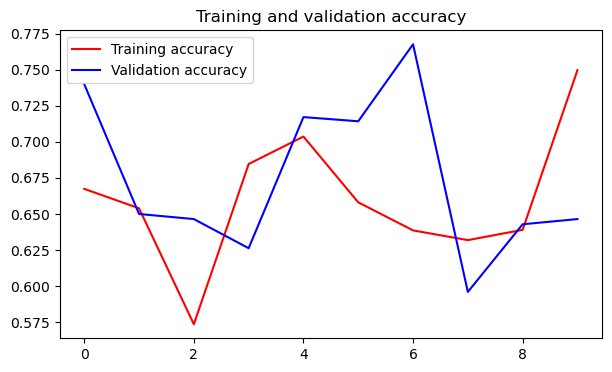

<Figure size 700x400 with 0 Axes>

In [114]:
plt.figure(figsize=(7,4))

plt.plot(results_df['Fold'], results_df['Train Accuracy'], 'r', label='Training accuracy')
plt.plot(results_df['Fold'], results_df['Validation Accuracy'], 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure(figsize=(7,4))

# plt.plot(epochs, loss, 'r', label='Training Loss')
# plt.plot(epochs, val_loss, 'b', label='Validation Loss')
# plt.title('Training and validation loss')
# plt.legend()

plt.show()

In [ ]:
from sklearn.metrics import classification_report,roc_auc_score

print(classification_report(df_pred_test_new['true_label'], df_pred_test_new['predicted_label']))

In [ ]:
from sklearn.metrics import accuracy_score
print('ACcuracy', accuracy_score(df_pred_train_new['true_label'], df_pred_train_new['predicted_label']))
print('ACcuracy', accuracy_score(df_pred_test_new['true_label'], df_pred_test_new['predicted_label']))

In [23]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
df_train['species_code'] = label_encoder.fit_transform(df_train['species'])
df_train['species_code'] = label_encoder.transform(df_train['species'])

In [24]:
with open('label_enconder.pickle', 'wb') as handle:
    pickle.dump(label_encoder, handle)

In [25]:
df_test['species_code'] = label_encoder.transform(df_test['species'])

In [26]:
df_train.head()

,index,species,file_path,folder,folder_division,full_path,species_code
0,0,marasmiusamazonicus,marasmiusamazonicus_214.jpg,Marasmiusamazonicus_PRE_PROCESSING,/Users/anarpereira/Docs_tcc/TCC/MIND.FungaApp/train,/Users/anarpereira/Docs_tcc/TCC/MIND.FungaApp/train/Marasmiusamazonicus_PRE_PROCESSING/marasmiusamazonicus_214.jpg,4
1,1,marasmiusamazonicus,marasmiusamazonicus_200.jpg,Marasmiusamazonicus_PRE_PROCESSING,/Users/anarpereira/Docs_tcc/TCC/MIND.FungaApp/train,/Users/anarpereira/Docs_tcc/TCC/MIND.FungaApp/train/Marasmiusamazonicus_PRE_PROCESSING/marasmiusamazonicus_200.jpg,4
2,2,marasmiusamazonicus,marasmiusamazonicus_228.jpg,Marasmiusamazonicus_PRE_PROCESSING,/Users/anarpereira/Docs_tcc/TCC/MIND.FungaApp/train,/Users/anarpereira/Docs_tcc/TCC/MIND.FungaApp/train/Marasmiusamazonicus_PRE_PROCESSING/marasmiusamazonicus_228.jpg,4
3,3,marasmiusamazonicus,marasmiusamazonicus_89.jpg,Marasmiusamazonicus_PRE_PROCESSING,/Users/anarpereira/Docs_tcc/TCC/MIND.FungaApp/train,/Users/anarpereira/Docs_tcc/TCC/MIND.FungaApp/train/Marasmiusamazonicus_PRE_PROCESSING/marasmiusamazonicus_89.jpg,4
4,4,marasmiusamazonicus,marasmiusamazonicus_189.jpg,Marasmiusamazonicus_PRE_PROCESSING,/Users/anarpereira/Docs_tcc/TCC/MIND.FungaApp/train,/Users/anarpereira/Docs_tcc/TCC/MIND.FungaApp/train/Marasmiusamazonicus_PRE_PROCESSING/marasmiusamazonicus_189.jpg,4


In [36]:
df_train.groupby(['species','species_code']).count()['index'].reset_index().to_csv('species_code.csv')

### Baseline without Data Augmentation

In [40]:
img_height = 224
img_width = 224
channels = 3
num_classes= df_train['species'].nunique()
X_train = img_train_normalized
y_train = df_train['species_code']
X_test = img_test_normalized
y_test = df_test['species_code']

In [41]:
y_test = np.asarray(y_test).astype('int').reshape((-1,1))

In [42]:
y_train = np.asarray(y_train).astype('int').reshape((-1,1))

In [43]:
from tensorflow.keras.utils import set_random_seed
set_random_seed(42)

In [44]:
from tensorflow.keras.applications.resnet50 import ResNet50
base_model = ResNet50(include_top=False,
                  input_shape=(img_height, img_width, channels))

2024-08-11 20:53:40.779229: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [45]:
for layer in base_model.layers:
    layer.trainable=False

In [46]:
base_model.compile()
base_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [47]:
# with open('first_version.pickle', 'rb') as handle:
#     model = pickle.load(handle)

In [48]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint,ReduceLROnPlateau

# Definir o Early Stopping
early_stopping = EarlyStopping(patience=10, monitor='val_loss', mode='min')
mcp_save = ModelCheckpoint('{epoch:02d}-{val_loss:.2f}.keras', save_best_only=True, monitor='val_loss', mode='min')
reduce_lr_loss = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=7, verbose=1, min_delta=1e-4, mode='min')

model = Sequential([base_model,
                    GlobalAveragePooling2D(),
                    Dense(1024, activation='relu'),
                    Dense(512, activation='relu'),
                    Dense(num_classes, activation='softmax')
])

model.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])

history = model.fit(X_train, 
                    y_train,
                    epochs=50, 
                    validation_data=(X_test, y_test),
                    callbacks=[early_stopping, mcp_save, reduce_lr_loss])

Epoch 1/50
67/67 [==============================] - 188s 3s/step - loss: 0.6172 - accuracy: 0.8328 - val_loss: 0.1086 - val_accuracy: 0.9636 - lr: 0.0010
Epoch 2/50
67/67 [==============================] - 16788s 254s/step - loss: 0.0940 - accuracy: 0.9673 - val_loss: 0.0235 - val_accuracy: 0.9934 - lr: 0.0010
Epoch 3/50
67/67 [==============================] - 9290s 3s/step - loss: 0.0241 - accuracy: 0.9921 - val_loss: 0.0292 - val_accuracy: 0.9901 - lr: 0.0010
Epoch 4/50
67/67 [==============================] - 2996s 45s/step - loss: 0.0299 - accuracy: 0.9897 - val_loss: 0.0134 - val_accuracy: 0.9950 - lr: 0.0010
Epoch 5/50
67/67 [==============================] - 14896s 226s/step - loss: 0.0026 - accuracy: 1.0000 - val_loss: 0.0085 - val_accuracy: 0.9950 - lr: 0.0010
Epoch 6/50
67/67 [==============================] - 196s 3s/step - loss: 6.6218e-04 - accuracy: 1.0000 - val_loss: 0.0083 - val_accuracy: 0.9959 - lr: 0.0010
Epoch 7/50
67/67 [==============================] - 228s 3s/s

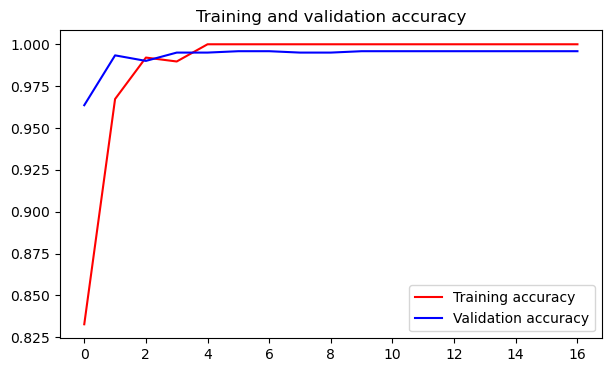

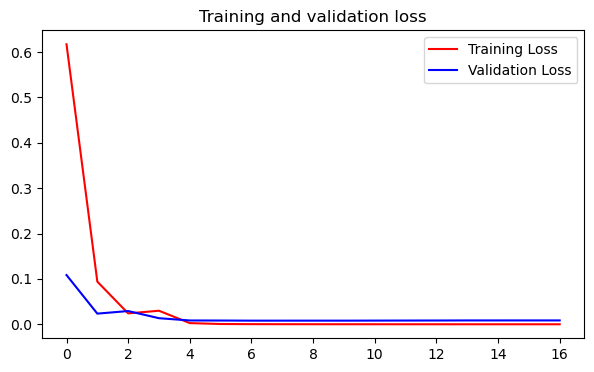

In [49]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.figure(figsize=(7,4))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure(figsize=(7,4))

plt.plot(epochs, loss, 'r', label='Training Loss')
plt.plot(epochs, val_loss, 'b', label='Validation Loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [50]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 1024)              2098176   
                                                                 
 dense_1 (Dense)             (None, 512)               524800    
                                                                 
 dense_2 (Dense)             (None, 10)                5130      
                                                                 
Total params: 26,215,818
Trainable params: 2,628,106
Non-trainable params: 23,587,712
____________________________________

In [51]:
with open('model_10_classes.pickle', 'wb') as handle:
    pickle.dump(model, handle)

INFO:tensorflow:Assets written to: ram://2d141b17-9869-49b8-9f96-ca06a256909e/assets


INFO:tensorflow:Assets written to: ram://2d141b17-9869-49b8-9f96-ca06a256909e/assets


In [52]:
def get_predictions(model, examples, y_true):
    """Realiza predicoes para todos os exemplos e retorna um dataframe com os valores reais e os valores preditos"""
    predictions = model.predict(examples)

    predicted_labels = np.argmax(predictions, axis=1)


    df_predictions = pd.DataFrame({'true_label': y_true.reshape(-1),
                                   'predicted_label': predicted_labels})

    return df_predictions



In [53]:
df_pred_test = get_predictions(model, X_test, y_test)

38/38 [==============================] - 69s 2s/step


In [54]:
df_pred_test_new = df_test.join(df_pred_test)

In [55]:
df_pred_train = get_predictions(model, X_train, y_train)

67/67 [==============================] - 126s 2s/step


In [56]:
df_pred_train_new = df_train.join(df_pred_train)

In [57]:
from sklearn.metrics import accuracy_score
print('ACcuracy', accuracy_score(df_pred_train_new['true_label'], df_pred_train_new['predicted_label']))
print('ACcuracy', accuracy_score(df_pred_test_new['true_label'], df_pred_test_new['predicted_label']))

ACcuracy 1.0
ACcuracy 0.9958643507030603


In [58]:
from sklearn.metrics import classification_report,roc_auc_score

print(classification_report(df_pred_test_new['true_label'], df_pred_test_new['predicted_label']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       178
           1       1.00      1.00      1.00       103
           2       0.99      1.00      1.00       103
           3       0.99      0.99      0.99        68
           4       1.00      1.00      1.00       185
           5       1.00      1.00      1.00        92
           6       1.00      0.99      1.00       105
           7       1.00      1.00      1.00       167
           8       0.98      1.00      0.99        96
           9       0.99      0.97      0.98       112

    accuracy                           1.00      1209
   macro avg       0.99      0.99      0.99      1209
weighted avg       1.00      1.00      1.00      1209



In [59]:
dict_classification_report = classification_report(df_pred_test_new['true_label'], df_pred_test_new['predicted_label'], output_dict=True)

In [60]:
df_class_report = pd.DataFrame(dict_classification_report).transpose()

In [61]:
df_class_report = df_class_report.reset_index().rename(columns={'index':'species_code'})

In [62]:
df_class_report_sin_acc = df_class_report[:-3]

In [63]:
df_class_report_sin_acc['species_code'] = df_class_report_sin_acc['species_code'].astype(int)

/var/folders/rt/0g5y9_m12p51plqsw3ghnp2d381wqs/T/ipykernel_14019/1557333058.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_class_report_sin_acc['species_code'] = df_class_report_sin_acc['species_code'].astype(int)


In [64]:
df_class_report_sin_acc.columns

Index(['species_code', 'precision', 'recall', 'f1-score', 'support'], dtype='object')

In [65]:
df_class_report_sin_acc['precision'].describe()

count    10.000000
mean      0.994618
std       0.007588
min       0.979592
25%       0.990516
50%       1.000000
75%       1.000000
max       1.000000
Name: precision, dtype: float64

In [66]:
df_class_report_sin_acc['f1-score'].describe()

count    10.000000
mean      0.994735
std       0.006801
min       0.981982
25%       0.991060
50%       0.997608
75%       1.000000
max       1.000000
Name: f1-score, dtype: float64

In [67]:
df_class_report_sin_acc['recall'].describe()

count    10.000000
mean      0.994898
std       0.009215
min       0.973214
25%       0.992857
50%       1.000000
75%       1.000000
max       1.000000
Name: recall, dtype: float64

In [68]:
df_class_report_sin_acc.merge(df_test[['species','species_code']].drop_duplicates(), on='species_code').to_excel('metrics_test.xlsx')

In [69]:
from sklearn.metrics import recall_score,f1_score,roc_auc_score,precision_score


In [70]:
precision_score(df_pred_test_new['true_label'], df_pred_test_new['predicted_label'], average = 'macro')

0.9946179660675458

In [71]:
macro_averaged_recall = recall_score(df_pred_test_new['true_label'], 
                                             df_pred_test_new['predicted_label'], 
                                             average = 'macro')

print(f"Macro-averaged recall score using sklearn : {macro_averaged_recall}")


Macro-averaged recall score using sklearn : 0.9948984593837535


In [72]:
macro_averaged_f1 = f1_score(df_pred_test_new['true_label'], df_pred_test_new['predicted_label'], average = 'macro')
print(f"Macro-Averaged F1 score using sklearn library : {macro_averaged_f1}")


Macro-Averaged F1 score using sklearn library : 0.9947351214408913


In [73]:
from sklearn.metrics import roc_auc_score

def roc_auc_score_multiclass(actual_class, pred_class, average = "macro"):
    
    #creating a set of all the unique classes using the actual class list
    unique_class = set(actual_class)
    roc_auc_dict = {}
    for per_class in unique_class:
        
        #creating a list of all the classes except the current class 
        other_class = [x for x in unique_class if x != per_class]

        #marking the current class as 1 and all other classes as 0
        new_actual_class = [0 if x in other_class else 1 for x in actual_class]
        new_pred_class = [0 if x in other_class else 1 for x in pred_class]

        #using the sklearn metrics method to calculate the roc_auc_score
        roc_auc = roc_auc_score(new_actual_class, new_pred_class, average = average)
        roc_auc_dict[per_class] = roc_auc

    return roc_auc_dict

In [74]:
dict_roc = roc_auc_score_multiclass(df_pred_test_new['true_label'], df_pred_test_new['predicted_label'])

In [75]:
np.mean([i for i in dict_roc.values()])

0.9972247744147396

In [76]:
from sklearn.metrics import cohen_kappa_score

cohen_kappa_score(df_pred_test_new['true_label'], df_pred_test_new['predicted_label'])

0.9953529526623853

In [77]:
count=0

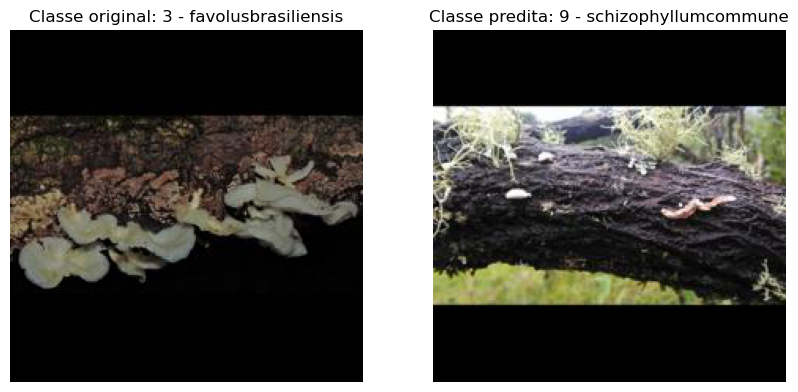

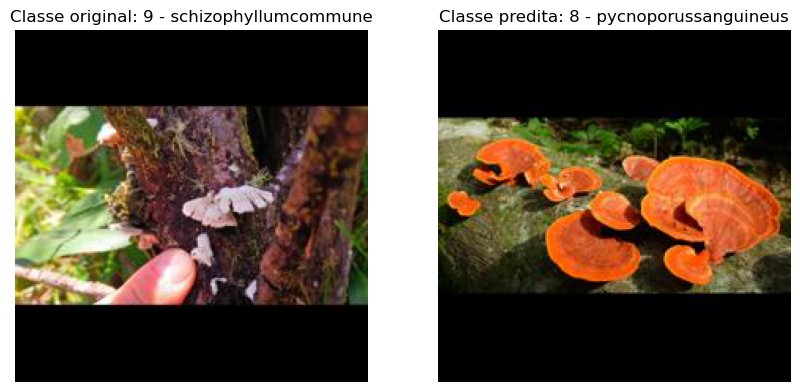

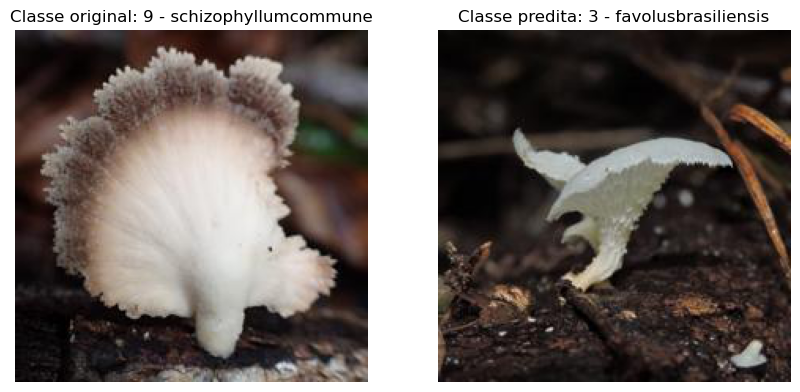

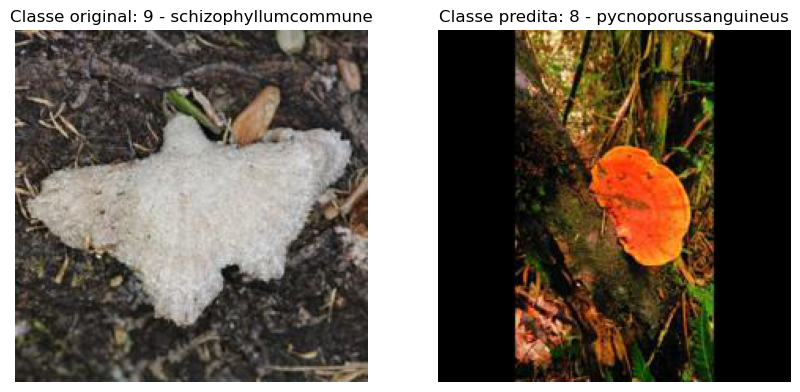

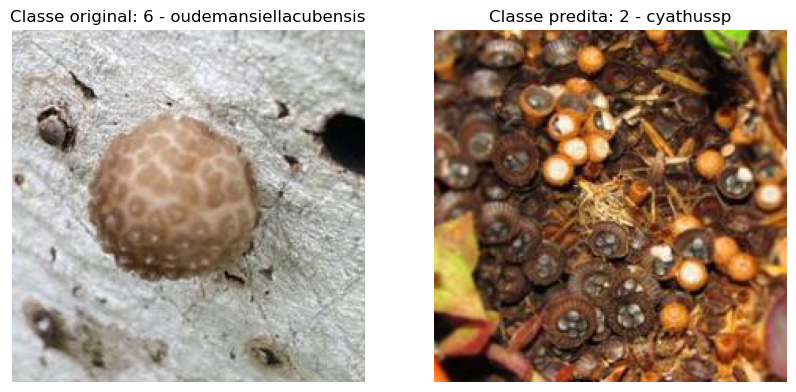

In [86]:
for i, j, full_path in zip(df_pred_test_new['species_code'], df_pred_test_new['predicted_label'], df_pred_test_new['full_path']):
    
    path_specie_true = full_path
    path_specie_predicted = df_pred_test_new.loc[df_pred_test_new['species_code']==j, 'full_path'].sample(n=1).values[0]
    
    specie_true = df_pred_test_new.loc[df_pred_test_new['species_code']==i, 'species'].iloc[0]
    specie_predicted = df_pred_test_new.loc[df_pred_test_new['species_code']==j, 'species'].iloc[0]
    
    if i != j:
        count+=1
        img_true = Image.open(path_specie_true)
        img_predicted = Image.open(path_specie_predicted)

        # Exibir as imagens usando matplotlib
        fig, axs = plt.subplots(1, 2, figsize=(10,10))
        axs[0].imshow(img_true, cmap='gray')
        axs[0].set_title('Classe original: {0} - {1}'.format(i,specie_true))
        axs[0].axis('off')  # Oculta os eixos para melhorar a visualização

        axs[1].imshow(img_predicted, cmap='gray')
        axs[1].set_title('Classe predita: {0} - {1}'.format(j, specie_predicted))
        axs[1].axis('off')  # Oculta os eixos para melhorar a visualização

        plt.show()

In [13]:
# train_folder = os.path.join(diretorio_base, 'train')
# test_folder = os.path.join(diretorio_base, 'test')

# for files_species in df['file_paths']:
#     random.seed(42)
#     random.shuffle(files_species)
    
#     # determine the number of images for each set
#     train_size = int(len(files_species) * 0.70)
#     test_size = int(len(files_species) * 0.30)
    
#     # Create destination folders if they don't exist
#     for folder_path in [train_folder, test_folder]:
#         if not os.path.exists(folder_path):
#             os.makedirs(folder_path)
            
#     # Copy image files to destination folders
#     for i, f in enumerate(files_species):
#         if i < train_size:
#             dest_folder = train_folder
#         else:
#             dest_folder = test_folder
        
#         for folder in folders:
#             if not os.path.exists(os.path.join(dest_folder, folder)):
#                 os.makedirs(os.path.join(dest_folder, folder))
    
#         shutil.copyfile(src=os.path.join(diretorio_base, f), dst=os.path.join(dest_folder, f))

# def get_data(folder_division):
#     df = pd.DataFrame(columns=['species','file_path','folder','folder_division'])

#     for files in os.listdir(folder_division):
#         if '.' not in files:
#             qty_files = len(os.listdir(os.path.join(folder_division, files)))
#             species = files.split('_')[0].lower()
#             df_temp = pd.DataFrame(data={'species':[species]*qty_files,
#                                          'file_path':os.listdir(os.path.join(folder_division, files)),
#                                          'folder':[files]*qty_files,
#                                          'folder_division':[folder_division]*qty_files},
#                                    columns=['species','file_path','folder','folder_division'])

#             df = pd.concat([df, df_temp])
#     return df.reset_index()

# df_train = get_data(train_folder)
# df_train['full_path'] = df_train['folder_division'] + '/' + df_train['folder'] + '/' + df_train['file_path']
# df_test = get_data(test_folder)
# df_test['full_path'] = df_test['folder_division'] + '/' + df_test['folder'] + '/' + df_test['file_path']